In [ ]:
import pandas as pd
import numpy as np
import datetime
import pickle
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import re
import optuna
from lightgbm import LGBMClassifier, early_stopping
from sklearn.feature_selection import mutual_info_classif




In [3]:
df = pd.read_pickle('C:\\diplomka_work\\python_code\\data_pickles\\train_cely.pkl')

In [ ]:



# Pridanie stĺpca `next_product_id`
df['next_product_name'] = df.groupby('doklad_id_int')['produkt_nazev'].shift(-1)

# Označenie, či je riadok posledný v objednávke
df['is_last'] = df['next_product_name'].isna()

# Odstránenie riadkov, kde je `is_last` True
df = df[~df['is_last']].copy()



# Odstránenie tried, ktoré majú menej ako 2 vzorky
class_counts = df['next_product_name'].value_counts()
valid_classes = class_counts[class_counts > 1].index
df = df[df['next_product_name'].isin(valid_classes)].copy()


In [6]:
column_names_dumm = ['produkt_nazev']
df = pd.get_dummies(df, columns = column_names_dumm)


In [7]:
# Automatický výber všetkých čŕt okrem identifikátorov a cieľových premenných
exclude_columns = ['doklad_id', 'produkt_id', 'item_sequence', 'poradi', 'next_product_name', 'next_product_id_encoded', 'is_last','otevreni_datum_cas','produkt_nazev', 'produkt_id_int', 'doklad_id_int']
features = [col for col in df.columns if col not in exclude_columns]

X = df[features]
y = df['next_product_name']

In [9]:
print(df.dtypes) 

doklad_id                            object
produkt_id                           object
is_bageta                             int64
is_pecivo                             int64
poradi                                int32
                                      ...  
produkt_nazev_Šunka & sýr sendvič     uint8
produkt_nazev_Šunková                 uint8
produkt_nazev_Šunková bageta          uint8
produkt_nazev_Švýcarská               uint8
produkt_nazev_Švýcarská petit         uint8
Length: 354, dtype: object


In [10]:
# Rozdelenie dát na tréningovú a testovaciu množinu
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

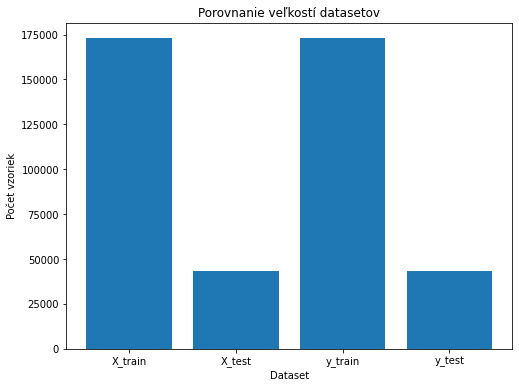

In [11]:


# Získanie veľkostí jednotlivých datasetov
sizes = {
    "X_train": len(X_train),
    "X_test": len(X_test),
    "y_train": len(y_train),
    "y_test": len(y_test),
}

# Vytvorenie grafu
plt.figure(figsize=(8, 6))
plt.bar(sizes.keys(), sizes.values())
plt.xlabel("Dataset")
plt.ylabel("Počet vzoriek")
plt.title("Porovnanie veľkostí datasetov")
plt.show()


In [ ]:

# Oprava názvov stĺpcov (odstránenie špeciálnych znakov)
X.columns = [re.sub(r'[^A-Za-z0-9_]', '_', col) for col in X.columns]

In [13]:
# Skontroluj dátové typy
print("Dátové typy v DataFrame:")
print(df.dtypes)

# Nájdeme stĺpce, ktoré nie sú int, float alebo bool
problematic_columns = df.select_dtypes(exclude=['int64', 'float64', 'bool']).columns.tolist()

# Výpis problematických stĺpcov
if problematic_columns:
    print("\n⚠️  Stĺpce s nesprávnym typom (môžu spôsobiť chybu v modelovaní):")
    print(problematic_columns)
else:
    print("\n✅  Všetky stĺpce sú v správnom formáte pre modelovanie.")

Dátové typy v DataFrame:
doklad_id                            object
produkt_id                           object
is_bageta                             int64
is_pecivo                             int64
poradi                                int32
                                      ...  
produkt_nazev_Šunka & sýr sendvič     uint8
produkt_nazev_Šunková                 uint8
produkt_nazev_Šunková bageta          uint8
produkt_nazev_Švýcarská               uint8
produkt_nazev_Švýcarská petit         uint8
Length: 354, dtype: object

⚠️  Stĺpce s nesprávnym typom (môžu spôsobiť chybu v modelovaní):
['doklad_id', 'produkt_id', 'poradi', 'otevreni_datum_cas', 'doklad_id_int', 'produkt_id_int', 'kasa_K10', 'kasa_K12', 'kasa_K14', 'kasa_K20', 'kasa_K21', 'kasa_K22', 'kasa_K23', 'kasa_K24', 'kasa_K25', 'kasa_K26', 'typ_kasy_D', 'typ_kasy_K', 'typ_kasy_N', 'typ_objednavky_sebou', 'typ_objednavky_tady', 'typ_peciva_--empty--', 'typ_peciva_bezlepkove', 'typ_peciva_rustic', 'typ_peciva_svetle', 't

In [14]:


dfcol = df.columns.tolist()

print(dfcol)

['doklad_id', 'produkt_id', 'is_bageta', 'is_pecivo', 'poradi', 'pata_za_polovinu', 'sleva', 'sleva_bagety', 'otevreni_datum_cas', 'HOUR', 'day_of_week', 'POLOZKA_CENA_VCETNE_DPH_PO_SLEVE', 'vernostni_karta', 'pata_za_polovinu.1', 'has_akcni_menu', 'has_menu', 'has_superpytlik', 'has_box_pro_2', 'has_Snidane', 'doklad_id_int', 'produkt_id_int', 'Month_Number', 'Year_Number', 'kasa_K10', 'kasa_K12', 'kasa_K14', 'kasa_K20', 'kasa_K21', 'kasa_K22', 'kasa_K23', 'kasa_K24', 'kasa_K25', 'kasa_K26', 'typ_kasy_D', 'typ_kasy_K', 'typ_kasy_N', 'typ_objednavky_sebou', 'typ_objednavky_tady', 'typ_peciva_--empty--', 'typ_peciva_bezlepkove', 'typ_peciva_rustic', 'typ_peciva_svetle', 'typ_peciva_svetle petit', 'typ_peciva_tmave', 'typ_peciva_tmave petit', 'food_drink_--empty--', 'food_drink_DRINK', 'food_drink_FOOD', 'segment_--empty--', 'segment_ADDON', 'segment_B4F', 'segment_BAGETY', 'segment_BBBOX', 'segment_CAJE', 'segment_CHEDDAR FINGERS', 'segment_COMBO', 'segment_DEZERTY', 'segment_DUET', 'se

In [ ]:
# --- Uloženie zoznamu features ---
with open('C:\\diplomka_work\\python_code\\data_pickles\\uložene_feature.pkl', 'wb') as f:
    pickle.dump(X_train.columns.tolist(), f)

In [ ]:

# Kódovanie cieľovej premennej (Label Encoding)
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

# Rozdelenie datasetu na trénovaciu a testovaciu množinu
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Definovanie cieľovej funkcie pre Optunu
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 2000),  # Počet iterácií
        "max_depth": trial.suggest_int("max_depth", 3, 12),  # Hĺbka stromov
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),  # Learning rate
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),  # Počet listov na strome
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 50),  # Min vzoriek v liste
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-3, 10),  # L1 regularizácia
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-3, 10),  # L2 regularizácia
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),  # Bagging
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),  # Výber čŕt
        "min_split_gain": trial.suggest_float("min_split_gain", 0, 0.2),  # Práh pre split
        "n_jobs": -1,  # Využitie všetkých CPU jadier
        "random_state": 42
    }

    # Trénovanie modelu
    model = LGBMClassifier(**params)
    model.fit(
        X_train, y_train, 
        eval_set=[(X_test, y_test)], 
        callbacks=[early_stopping(50, verbose=False)]  # **Použitý správny spôsob Early Stopping**
    )

    # Predikcia
    y_pred = model.predict(X_test)

    # Vyhodnotenie presnosti
    return accuracy_score(y_test, y_pred)

# Spustenie Optuny s viac iteráciami
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50, n_jobs=-1)  # 50 skúšok pre lepšiu optimalizáciu

# Najlepšie parametre
best_params = study.best_params
print("Najlepšie parametre:", best_params)




In [ ]:


# --- Label encoding cieľa ---
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

# --- Split ---
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)


# --- Trénovanie finálneho modelu ---
final_model = LGBMClassifier(**best_params)

final_model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    callbacks=[early_stopping(80, verbose=True)]
)

# --- Predikcia ---
y_pred_final = final_model.predict(X_test)

# --- Vyhodnotenie ---
final_accuracy = accuracy_score(y_test, y_pred_final)
print(f"Final LightGBM Accuracy: {final_accuracy:.4f}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1182
[LightGBM] [Info] Number of data points in the train set: 172913, number of used features: 322
[LightGBM] [Info] Start training from score -6.282892
[LightGBM] [Info] Start training from score -7.703835
[LightGBM] [Info] Start training from score -3.476440
[LightGBM] [Info] Start training from score -6.273646
[LightGBM] [Info] Start training from score -5.914215
[LightGBM] [Info] Start training from score -4.166226
[LightGBM] [Info] Start training from score -6.676049
[LightGBM] [Info] Start training from score -4.845304
[LightGBM] [Info] Start training from score -4.907492
[LightGBM] [Info] Start training from score -5.212539
[LightGBM] [Info] Start training from score -5.059298
[LightGBM] [Info] Start training from score -7.2565

In [21]:
 
 #dsd label_encoder
 
 with open('C:\\diplomka_work\\python_code\\data_pickles\\LGBM\\label_encoder.pkl', 'wb') as f:
     pickle.dump(encoder, f)


In [22]:
# --- Uloženie zoznamu features ---
with open('C:\\diplomka_work\\python_code\\data_pickles\\LGBM\\uložene_feature.pkl', 'wb') as f:
    pickle.dump(X_train.columns.tolist(), f)

In [23]:
# Uloženie modelu do súboru
with open('C:\\diplomka_work\\python_code\\data_pickles\\LGBM\\saved_model.pkl', 'wb') as file:
    pickle.dump(final_model, file=file)

In [ ]:


# Cesta k súboru, kde sa uloží Optuna štúdia
pickle_path = "C:\\diplomka_work\\python_code\\data_pickles\\optuna_BB_lgbm.pkl"

# Uloženie Optuna štúdie
with open(pickle_path, "wb") as f:
    pickle.dump(study, f)

print(f"Optuna štúdia bola uložená do: {pickle_path}")


In [ ]:
with open(pickle_path, "rb") as f:
    study = pickle.load(f)

# Výpis najlepších parametrov
print("Najlepšie parametre:", study.best_params)

In [25]:
# Vyhodnotenie presnosti na trénovacej množine
y_train_pred = final_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {final_accuracy:.4f}")


Train Accuracy: 0.5782
Test Accuracy: 0.5418
